In [184]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import math
import itertools
import torch

In [185]:
PATH='/home/nfs/data/nvme_datasets/Pictures_CFSB_leaf_damage/RSFB-Phenotyping_training_set/RSFB-Phenotyping_training_set'
FILE = 'RSFB-Phenotyping_training_set_scores.csv'

In [186]:
data = pd.read_csv(os.path.join(PATH, FILE))
data.head()

,Filename,Score_JLU,Score_GAU,mean_score
0,20251021_120858,10,10.5,10.25
1,20251021_120905,13,16.5,14.75
2,20251021_120912,9,6.5,7.75
3,20251021_120926,23,19.5,21.25
4,20251021_120933,20,21.5,20.75


In [187]:
images_name = list(data['Filename'])
label = list(data['mean_score'])
images_name

['20251021_120858',
 '20251021_120905',
 '20251021_120912',
 '20251021_120926',
 '20251021_120933',
 '20251021_120939',
 '20251021_121011',
 '20251021_121034',
 '20251021_121047',
 '20251021_121100',
 '20251021_121120',
 '20251021_121149',
 '20251021_121203',
 '20251021_121218',
 '20251021_121225',
 '20251021_121253',
 '20251021_121320',
 '20251021_121327',
 '20251021_121345',
 '20251021_121432',
 '20251021_121449',
 '20251021_121457',
 '20251021_121504',
 '20251021_121525',
 '20251021_121618',
 '20251021_121624',
 '20251021_121633',
 '20251021_121647',
 '20251021_121655',
 '20251021_121704',
 '20251021_121804',
 '20251021_121810',
 '20251021_121827',
 '20251021_121858',
 '20251021_121959',
 '20251021_122117',
 '20251021_122135',
 '20251021_122227',
 '20251021_122242',
 '20251021_122314',
 '20251021_122322',
 '20251021_122353',
 '20251021_122423',
 '20251021_122445',
 '20251021_122452',
 '20251021_122502',
 '20251021_122516',
 '20251021_122523',
 '20251021_122531',
 '20251021_122628',


In [188]:
os.path.join(PATH, FILE,images_name[0]+'.jpg')

'/home/nfs/data/nvme_datasets/Pictures_CFSB_leaf_damage/RSFB-Phenotyping_training_set/RSFB-Phenotyping_training_set/RSFB-Phenotyping_training_set_scores.csv/20251021_120858.jpg'

In [189]:
# Detection is performed on a resized copy for speed.
MAX_DETECTION_DIMENSION = 1600

# Final width and height of each extracted square.
CELL_SIZE = 900

# Removes the steel bars from the borders of each extracted cell.
INNER_MARGIN_FRACTION = 0.05

# Steel-color thresholds.
# Steel is generally less saturated than brown soil.
SATURATION_MAX = 60
VALUE_MIN = 70

# Maximum allowed deviation from horizontal or vertical.
ANGLE_TOLERANCE = 14.0

In [190]:
def resize_for_detection(
    image: np.ndarray,
    maximum_dimension: int,
) -> tuple[np.ndarray, float]:
    height, width = image.shape[:2]

    scale = min(1.0, maximum_dimension / max(height, width))

    if scale == 1.0:
        return image.copy(), scale

    resized = cv2.resize(
        image,
        None,
        fx=scale,
        fy=scale,
        interpolation=cv2.INTER_AREA,
    )

    return resized, scale


def detect_possible_steel(
    image: np.ndarray,
) -> tuple[np.ndarray, np.ndarray]:
    """Build a permissive steel mask and an edge mask for Hough fallback.

    The primary detector below uses the source image directly. This mask is
    deliberately permissive because polished steel changes brightness and hue
    along a bar as it reflects the sky and soil.
    """
    minimum_dimension = min(image.shape[:2])

    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    saturation = hsv[:, :, 1]
    value = hsv[:, :, 2]

    steel_color_mask = (
        (saturation < SATURATION_MAX)
        & (value > VALUE_MIN)
    ).astype(np.uint8) * 255

    close_size = max(3, int(round(minimum_dimension * 0.004)))
    if close_size % 2 == 0:
        close_size += 1

    steel_color_mask = cv2.morphologyEx(
        steel_color_mask,
        cv2.MORPH_CLOSE,
        cv2.getStructuringElement(
            cv2.MORPH_ELLIPSE,
            (close_size, close_size),
        ),
    )

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.createCLAHE(
        clipLimit=2.0,
        tileGridSize=(8, 8),
    ).apply(gray)
    gray = cv2.GaussianBlur(gray, (5, 5), 0)

    median_intensity = float(np.median(gray))
    lower = int(max(20, 0.55 * median_intensity))
    upper = int(min(220, max(lower + 30, 1.45 * median_intensity)))

    edges = cv2.Canny(gray, lower, upper)

    support_size = max(3, int(round(minimum_dimension * 0.007)))
    if support_size % 2 == 0:
        support_size += 1

    color_support = cv2.dilate(
        steel_color_mask,
        cv2.getStructuringElement(
            cv2.MORPH_ELLIPSE,
            (support_size, support_size),
        ),
    )

    steel_line_mask = cv2.bitwise_and(edges, color_support)
    return steel_color_mask, steel_line_mask


def _segments_from_lsd(
    source_image: np.ndarray,
) -> list[tuple[float, float, tuple[int, int, int, int]]]:
    """Detect long, coherent segments without assuming exact axis alignment."""
    if source_image.ndim == 3:
        gray = cv2.cvtColor(source_image, cv2.COLOR_BGR2GRAY)
    else:
        gray = source_image.copy()

    gray = cv2.GaussianBlur(gray, (5, 5), 0)
    minimum_dimension = min(gray.shape[:2])

    detector = cv2.createLineSegmentDetector(cv2.LSD_REFINE_ADV)
    detected = detector.detect(gray)[0]

    if detected is None:
        return []

    minimum_length = max(35.0, minimum_dimension * 0.04)
    segments = []

    for x1, y1, x2, y2 in np.asarray(detected).reshape(-1, 4):
        dx = float(x2 - x1)
        dy = float(y2 - y1)
        length = math.hypot(dx, dy)

        if length < minimum_length:
            continue

        angle = math.degrees(math.atan2(dy, dx)) % 180.0

        segments.append(
            (
                length,
                angle,
                (
                    int(round(x1)),
                    int(round(y1)),
                    int(round(x2)),
                    int(round(y2)),
                ),
            )
        )

    return segments


def _segments_from_hough(
    line_mask: np.ndarray,
) -> list[tuple[float, float, tuple[int, int, int, int]]]:
    """Compatibility fallback for images where LSD returns too few segments."""
    height, width = line_mask.shape[:2]
    minimum_dimension = min(height, width)

    detected = cv2.HoughLinesP(
        line_mask,
        rho=1,
        theta=np.pi / 720,
        threshold=max(25, int(round(minimum_dimension * 0.03))),
        minLineLength=max(40, int(round(minimum_dimension * 0.05))),
        maxLineGap=max(20, int(round(minimum_dimension * 0.04))),
    )

    if detected is None:
        return []

    segments = []

    for x1, y1, x2, y2 in np.asarray(detected).reshape(-1, 4):
        dx = float(x2 - x1)
        dy = float(y2 - y1)
        length = math.hypot(dx, dy)
        angle = math.degrees(math.atan2(dy, dx)) % 180.0

        segments.append(
            (
                length,
                angle,
                (int(x1), int(y1), int(x2), int(y2)),
            )
        )

    return segments


def detect_line_segments(
    line_mask: np.ndarray,
    source_image: np.ndarray | None = None,
) -> list[tuple[float, float, tuple[int, int, int, int]]]:
    """Return segments in the same format as the original implementation.

    Passing ``source_image`` enables the stronger LSD path. Calling this with
    only ``line_mask`` remains supported and uses the previous Hough-style path.
    """
    if source_image is not None:
        segments = _segments_from_lsd(source_image)
        if segments:
            return segments

    segments = _segments_from_hough(line_mask)

    if not segments:
        raise RuntimeError(
            "No sufficiently long steel-line candidates were detected."
        )

    return segments


def _signed_orientation_error(angle: float, orientation: str) -> float:
    if orientation == "horizontal":
        return angle if angle <= 90.0 else angle - 180.0
    if orientation == "vertical":
        return angle - 90.0
    raise ValueError("orientation must be 'vertical' or 'horizontal'")


def cluster_similar_lines(
    segments: list[tuple[float, float, tuple[int, int, int, int]]],
    image_shape: tuple[int, int],
    orientation: str,
) -> list[dict]:
    """Group fragments belonging to the same projected steel bar."""
    height, width = image_shape
    minimum_dimension = min(height, width)
    center_x = width / 2.0
    center_y = height / 2.0

    candidates = []

    for length, angle, segment in segments:
        orientation_error = _signed_orientation_error(angle, orientation)

        if abs(orientation_error) > ANGLE_TOLERANCE:
            continue

        x1, y1, x2, y2 = segment

        if orientation == "vertical":
            if abs(y2 - y1) < 1:
                continue
            position = x1 + (center_y - y1) * (x2 - x1) / (y2 - y1)
        else:
            if abs(x2 - x1) < 1:
                continue
            position = y1 + (center_x - x1) * (y2 - y1) / (x2 - x1)

        # Lines far outside the image are extrapolation artifacts.
        relevant_dimension = width if orientation == "vertical" else height
        if not -0.15 * relevant_dimension <= position <= 1.15 * relevant_dimension:
            continue

        candidates.append(
            (
                float(position),
                float(length),
                segment,
                float(orientation_error),
            )
        )

    candidates.sort(key=lambda item: item[0])

    position_tolerance = minimum_dimension * 0.018
    angle_tolerance = max(4.0, ANGLE_TOLERANCE * 0.6)
    groups: list[list] = []

    for candidate in candidates:
        best_group = None
        best_cost = float("inf")

        for group_index, group in enumerate(groups):
            weights = [item[1] for item in group]
            group_position = float(np.average(
                [item[0] for item in group],
                weights=weights,
            ))
            group_angle = float(np.average(
                [item[3] for item in group],
                weights=weights,
            ))

            position_distance = abs(candidate[0] - group_position)
            angle_distance = abs(candidate[3] - group_angle)

            if (
                position_distance <= position_tolerance
                and angle_distance <= angle_tolerance
            ):
                cost = (
                    position_distance / position_tolerance
                    + angle_distance / angle_tolerance
                )
                if cost < best_cost:
                    best_group = group_index
                    best_cost = cost

        if best_group is None:
            groups.append([candidate])
        else:
            groups[best_group].append(candidate)

    clusters = []

    for group in groups:
        weights = [item[1] for item in group]
        clusters.append(
            {
                "position": float(np.average(
                    [item[0] for item in group],
                    weights=weights,
                )),
                "support": float(sum(weights)),
                "angle": float(np.average(
                    [item[3] for item in group],
                    weights=weights,
                )),
                "segments": [item[2] for item in group],
            }
        )

    return sorted(clusters, key=lambda cluster: cluster["position"])


def choose_three_grid_lines(
    clusters: list[dict],
    dimension: int,
) -> list[dict]:
    """Select three strong, approximately equally spaced projected bars."""
    strongest = sorted(
        clusters,
        key=lambda cluster: cluster["support"],
        reverse=True,
    )[:12]
    strongest.sort(key=lambda cluster: cluster["position"])

    best_result = None

    for candidate_triplet in itertools.combinations(strongest, 3):
        positions = [cluster["position"] for cluster in candidate_triplet]
        total_span = positions[2] - positions[0]

        if not dimension * 0.18 <= total_span <= dimension * 0.82:
            continue

        first_spacing = positions[1] - positions[0]
        second_spacing = positions[2] - positions[1]

        if first_spacing <= 0 or second_spacing <= 0:
            continue

        spacing_error = abs(first_spacing - second_spacing) / total_span

        if spacing_error > 0.32:
            continue

        total_support = sum(cluster["support"] for cluster in candidate_triplet)
        mean_angle = float(np.average(
            [cluster.get("angle", 0.0) for cluster in candidate_triplet],
            weights=[cluster["support"] for cluster in candidate_triplet],
        ))
        angle_spread = max(
            abs(cluster.get("angle", 0.0) - mean_angle)
            for cluster in candidate_triplet
        )

        # Equal spacing matters strongly; angle consistency helps reject label
        # edges and long soil/straw features.
        score = total_support * math.exp(
            -4.0 * spacing_error
            -0.08 * angle_spread
        )

        if best_result is None or score > best_result[0]:
            best_result = (score, candidate_triplet)

    if best_result is None:
        cluster_information = [
            (
                round(cluster["position"], 1),
                round(cluster["support"], 1),
                round(cluster.get("angle", 0.0), 1),
            )
            for cluster in strongest
        ]
        raise RuntimeError(
            "Could not find three equally spaced steel bars. "
            "Detected clusters (position, support, angle): "
            f"{cluster_information}"
        )

    return list(best_result[1])


def fit_infinite_line(cluster: dict) -> np.ndarray:
    """Fit a robust homogeneous line a*x + b*y + c = 0."""
    points = []

    for x1, y1, x2, y2 in cluster["segments"]:
        points.append((x1, y1))
        points.append((x2, y2))

    points_array = np.asarray(points, dtype=np.float32).reshape(-1, 1, 2)

    vx, vy, x0, y0 = cv2.fitLine(
        points_array,
        cv2.DIST_HUBER,
        0,
        0.01,
        0.01,
    ).reshape(-1)

    a = float(vy)
    b = float(-vx)
    c = -(a * float(x0) + b * float(y0))
    normalization = math.hypot(a, b)

    return np.array(
        [a / normalization, b / normalization, c / normalization],
        dtype=np.float64,
    )


def line_intersection(
    first_line: np.ndarray,
    second_line: np.ndarray,
) -> np.ndarray:
    intersection = np.cross(first_line, second_line)

    if abs(intersection[2]) < 1e-8:
        raise RuntimeError("Detected steel lines are parallel or invalid.")

    return np.array(
        [
            intersection[0] / intersection[2],
            intersection[1] / intersection[2],
        ],
        dtype=np.float32,
    )


def _select_grid_lines(
    segments: list[tuple[float, float, tuple[int, int, int, int]]],
    image_shape: tuple[int, int],
) -> tuple[list[dict], list[dict]]:
    vertical_clusters = cluster_similar_lines(
        segments,
        image_shape,
        orientation="vertical",
    )
    horizontal_clusters = cluster_similar_lines(
        segments,
        image_shape,
        orientation="horizontal",
    )

    selected_vertical = choose_three_grid_lines(
        vertical_clusters,
        image_shape[1],
    )
    selected_horizontal = choose_three_grid_lines(
        horizontal_clusters,
        image_shape[0],
    )

    return selected_vertical, selected_horizontal


def _render_grid_mask(
    image_shape: tuple[int, int],
    grid_points: np.ndarray,
) -> np.ndarray:
    mask = np.zeros(image_shape, dtype=np.uint8)
    thickness = max(2, int(round(min(image_shape) * 0.005)))

    for row in range(3):
        start = tuple(np.round(grid_points[row, 0]).astype(int))
        end = tuple(np.round(grid_points[row, 2]).astype(int))
        cv2.line(mask, start, end, 255, thickness)

    for column in range(3):
        start = tuple(np.round(grid_points[0, column]).astype(int))
        end = tuple(np.round(grid_points[2, column]).astype(int))
        cv2.line(mask, start, end, 255, thickness)

    return mask


def detect_grid(
    image: np.ndarray,
) -> tuple[np.ndarray, np.ndarray, np.ndarray]:
    """Detect the 3x3 intersections while preserving the original API."""
    if image is None or image.ndim != 3:
        raise ValueError("detect_grid expects a valid BGR color image")

    detection_image, scale = resize_for_detection(
        image,
        MAX_DETECTION_DIMENSION,
    )

    _, candidate_mask = detect_possible_steel(detection_image)

    # Primary path: perspective- and occlusion-tolerant LSD segments.
    segments = detect_line_segments(
        candidate_mask,
        source_image=detection_image,
    )

    try:
        selected_vertical, selected_horizontal = _select_grid_lines(
            segments,
            candidate_mask.shape,
        )
    except RuntimeError as primary_error:
        # Fallback: supplement LSD with Hough candidates from the color/edge mask.
        hough_segments = _segments_from_hough(candidate_mask)
        try:
            selected_vertical, selected_horizontal = _select_grid_lines(
                segments + hough_segments,
                candidate_mask.shape,
            )
        except RuntimeError as fallback_error:
            raise RuntimeError(
                "Grid detection failed with both LSD and Hough candidates. "
                f"LSD result: {primary_error}; fallback result: {fallback_error}"
            ) from fallback_error

    vertical_lines = [
        fit_infinite_line(cluster)
        for cluster in selected_vertical
    ]
    horizontal_lines = [
        fit_infinite_line(cluster)
        for cluster in selected_horizontal
    ]

    detection_grid_points = np.zeros((3, 3, 2), dtype=np.float32)

    for row, horizontal_line in enumerate(horizontal_lines):
        for column, vertical_line in enumerate(vertical_lines):
            detection_grid_points[row, column] = line_intersection(
                horizontal_line,
                vertical_line,
            )

    if not np.isfinite(detection_grid_points).all():
        raise RuntimeError("Grid intersections contain invalid coordinates.")

    outer_corners = np.float32([
        detection_grid_points[0, 0],
        detection_grid_points[0, 2],
        detection_grid_points[2, 2],
        detection_grid_points[2, 0],
    ])
    grid_area = abs(cv2.contourArea(outer_corners))

    if grid_area < 0.025 * candidate_mask.size:
        raise RuntimeError(
            "Detected lines form an implausibly small grid; refusing the result."
        )

    steel_line_mask = _render_grid_mask(
        candidate_mask.shape,
        detection_grid_points,
    )
    grid_points = detection_grid_points / scale

    return grid_points, detection_image, steel_line_mask



def warp_cell(
    image: np.ndarray,
    corners: np.ndarray,
) -> np.ndarray:
    """
    Perspective-corrects one cell and removes its steel border.
    """
    canvas_size = int(
        round(
            CELL_SIZE
            / (1.0 - 2.0 * INNER_MARGIN_FRACTION)
        )
    )

    destination = np.float32(
        [
            [0, 0],
            [canvas_size - 1, 0],
            [canvas_size - 1, canvas_size - 1],
            [0, canvas_size - 1],
        ]
    )

    transformation = cv2.getPerspectiveTransform(
        corners.astype(np.float32),
        destination,
    )

    warped = cv2.warpPerspective(
        image,
        transformation,
        (canvas_size, canvas_size),
        flags=cv2.INTER_LINEAR,
    )

    margin = (canvas_size - CELL_SIZE) // 2

    cropped = warped[
        margin:margin + CELL_SIZE,
        margin:margin + CELL_SIZE,
    ]

    return cropped

def warp_big_square(
    image: np.ndarray,
    grid_points: np.ndarray,
    size: int = 1400,
) -> np.ndarray:
    """
    Extract and perspective-correct the entire large quadrat.

    Uses only the four outer corners of the detected steel grid.
    """

    corners = np.float32([
        grid_points[0, 0],  # top-left
        grid_points[0, 2],  # top-right
        grid_points[2, 2],  # bottom-right
        grid_points[2, 0],  # bottom-left
    ])

    destination = np.float32([
        [0, 0],
        [size - 1, 0],
        [size - 1, size - 1],
        [0, size - 1],
    ])

    matrix = cv2.getPerspectiveTransform(
        corners,
        destination,
    )

    big_square = cv2.warpPerspective(
        image,
        matrix,
        (size, size),
        flags=cv2.INTER_LINEAR,
    )

    return big_square

In [191]:
image_path = os.path.join(PATH, images_name[446]+'.jpg')
images_name[446]

'20251021_162459'

In [192]:

def image_to_ndarray(image: str) -> np.ndarray:
    return cv2.imread(image)

In [193]:
image = cv2.imread(str(image_path)) # if this was a function it will be called 

In [194]:
grid_points, _, steel_line_mask = detect_grid(
    image
)

cell_names = {
    (0, 0): "01_top_left.jpg",
    (0, 1): "02_top_right.jpg",
    (1, 0): "03_bottom_left.jpg",
    (1, 1): "04_bottom_right.jpg",
}

In [195]:
CELL_LAYOUT = [
    ("01_top_left", 0, 0, "Top left"),
    ("02_top_right", 0, 1, "Top right"),
    ("03_bottom_left", 1, 0, "Bottom left"),
    ("04_bottom_right", 1, 1, "Bottom right"),
]

cells =   { name: warp_cell(image, np.array(
        [
            grid_points[row, column],
            grid_points[row, column + 1],
            grid_points[row + 1, column + 1],
            grid_points[row + 1, column],
        ],
        dtype=np.float32,
    ),
    )
        for name, row, column, _ in CELL_LAYOUT
    }

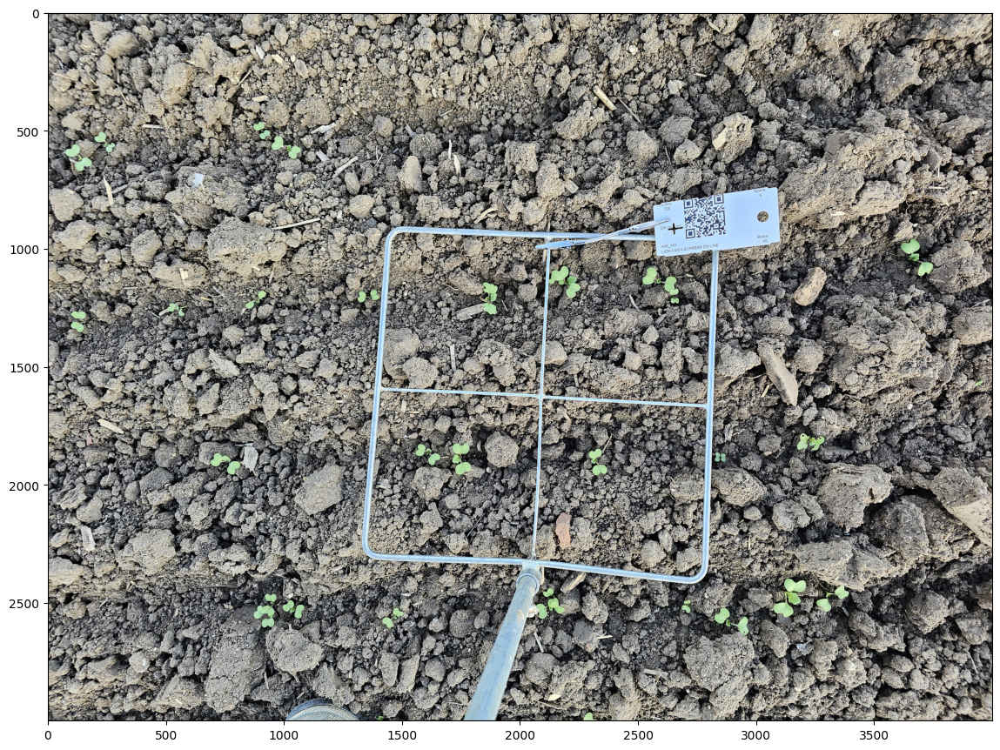

In [196]:
# make plot big
plt.figure(figsize=(14, 13))
plt.imshow(np.asarray(Image.open(image_path).rotate(180)))
plt.show()


In [197]:
sets = []

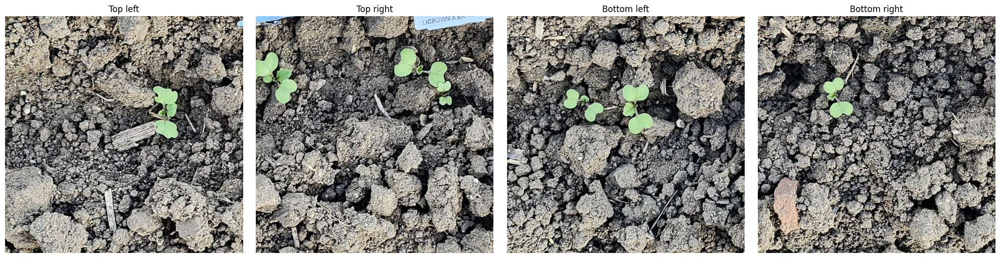

In [198]:
figure, axes = plt.subplots(
        1,
        4,
        figsize=(20, 5),
    )

for axis, (name, _, _, title) in zip(
    axes,
    CELL_LAYOUT,
):
    # OpenCV uses BGR; Matplotlib expects RGB.
    rgb_cell = cv2.cvtColor(
        cells[name],
        cv2.COLOR_BGR2RGB,
    )
    sets.append(rgb_cell)
    axis.imshow(rgb_cell)
    axis.set_title(title)
    axis.axis("off")

figure.tight_layout()


plt.show(figure)

In [199]:
from transformers import Sam3Model, Sam3Processor


device = "cuda" if torch.cuda.is_available() else "cpu"

sam_processor = Sam3Processor.from_pretrained("facebook/sam3")

sam_model = Sam3Model.from_pretrained(
    "facebook/sam3",
).to(device)

sam_model.eval()

Loading weights: 100%|██████████| 1468/1468 [00:00<00:00, 10655.96it/s]


Sam3Model(
  (vision_encoder): Sam3VisionModel(
    (backbone): Sam3ViTModel(
      (embeddings): Sam3ViTEmbeddings(
        (patch_embeddings): Sam3ViTPatchEmbeddings(
          (projection): Conv2d(3, 1024, kernel_size=(14, 14), stride=(14, 14), bias=False)
        )
        (dropout): Dropout(p=0.0, inplace=False)
      )
      (layer_norm): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
      (layers): ModuleList(
        (0-31): 32 x Sam3ViTLayer(
          (layer_norm1): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
          (rotary_emb): Sam3ViTRotaryEmbedding()
          (attention): Sam3ViTRoPEAttention(
            (q_proj): Linear(in_features=1024, out_features=1024, bias=True)
            (k_proj): Linear(in_features=1024, out_features=1024, bias=True)
            (v_proj): Linear(in_features=1024, out_features=1024, bias=True)
            (o_proj): Linear(in_features=1024, out_features=1024, bias=True)
          )
          (layer_norm2): LayerNorm((1024,

In [200]:
def segment_plants(
    rgb_cell,
    prompts=("green leaf",),
    score_threshold=0.25,
    mask_threshold=0.5,
):
    array = np.asarray(rgb_cell)

    # Ensure PIL-compatible uint8 data.
    if array.dtype != np.uint8:
        if array.max() <= 1:
            array = array * 255

        array = np.clip(array, 0, 255).astype(np.uint8)

    image = Image.fromarray(array, mode="RGB")

    combined_mask = np.zeros(
        (image.height, image.width),
        dtype=bool,
    )

    for prompt in prompts:
        inputs = sam_processor(
            images=image,
            text=prompt,
            return_tensors="pt",
        ).to(device)

        with torch.inference_mode():
            outputs = sam_model(**inputs)

        result = sam_processor.post_process_instance_segmentation(
            outputs,
            threshold=score_threshold,
            mask_threshold=mask_threshold,
            target_sizes=inputs["original_sizes"].tolist(),
        )[0]

        masks = result["masks"]

        print(
            f"{prompt!r}: {len(masks)} object(s) detected"
        )

        if len(masks) > 0:
            prompt_mask = (
                masks.any(dim=0)
                .cpu()
                .numpy()
                .astype(bool)
            )

            combined_mask |= prompt_mask

    # Keep original plant pixels on a white background.
    plant_only = np.full_like(array, 255)
    plant_only[combined_mask] = array[combined_mask]

    return combined_mask, plant_only

In [201]:
plant_mask, plant_only = segment_plants(sets[1])

'green leaf': 13 object(s) detected


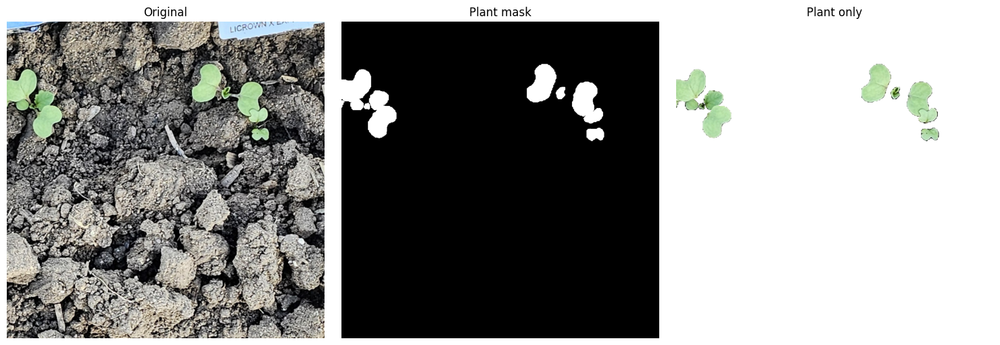

In [202]:
figure, axes = plt.subplots(
    1,
    3,
    figsize=(15, 5),
)

axes[0].imshow(sets[1])
axes[0].set_title("Original")

axes[1].imshow(plant_mask, cmap="gray")
axes[1].set_title("Plant mask")

axes[2].imshow(plant_only)
axes[2].set_title("Plant only")

for axis in axes:
    axis.axis("off")

plt.tight_layout()
plt.show()

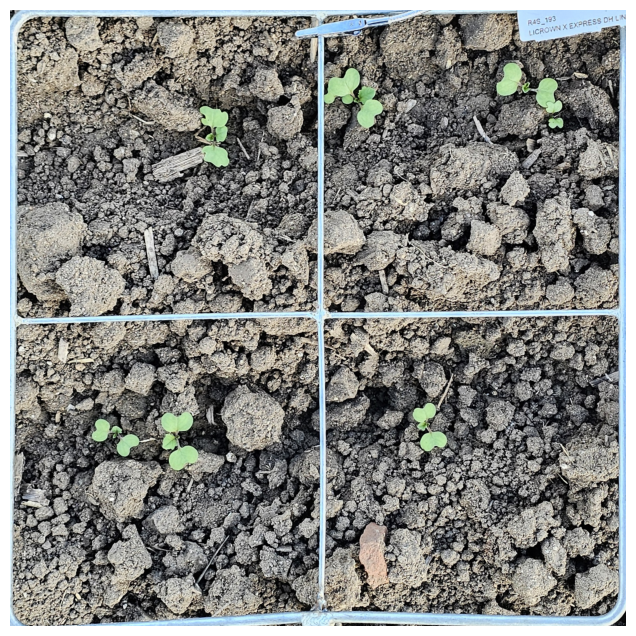

In [203]:
grid_points, _, _ = detect_grid(image)
big_square = warp_big_square(
    image,
    grid_points,
)

plt.figure(figsize=(8, 8))
plt.imshow(
    cv2.cvtColor(big_square, cv2.COLOR_BGR2RGB)
)
plt.axis("off")
plt.show()

In [204]:
plant_mask, plant_only = segment_plants(big_square)

'green leaf': 36 object(s) detected


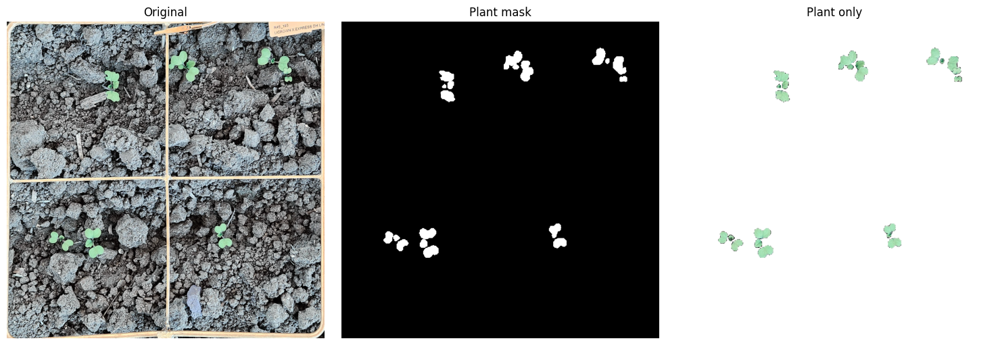

In [205]:
figure, axes = plt.subplots(
    1,
    3,
    figsize=(15, 5),
)

axes[0].imshow(big_square)
axes[0].set_title("Original")

axes[1].imshow(plant_mask, cmap="gray")
axes[1].set_title("Plant mask")

axes[2].imshow(plant_only)
axes[2].set_title("Plant only")

for axis in axes:
    axis.axis("off")

plt.tight_layout()
plt.show()

In [206]:
import torch
from transformers import AutoImageProcessor, AutoModel
from transformers.image_utils import load_image


print("Image size:", image.shape)  # [480, 640]

dino_processor = AutoImageProcessor.from_pretrained("facebook/dinov3-vits16-pretrain-lvd1689m")
dino_model = AutoModel.from_pretrained("facebook/dinov3-vits16-pretrain-lvd1689m", device_map="auto")
patch_size = dino_model.config.patch_size
print("Patch size:", patch_size) # 16
print("Num register tokens:", dino_model.config.num_register_tokens) # 4

inputs = dino_processor(images=image, return_tensors="pt").to(dino_model.device)
print("Preprocessed image size:", inputs.pixel_values.shape)  # [1, 3, 224, 224]

batch_size, _, img_height, img_width = inputs.pixel_values.shape
num_patches_height, num_patches_width = img_height // patch_size, img_width // patch_size
num_patches_flat = num_patches_height * num_patches_width

with torch.inference_mode():
  outputs = dino_model(**inputs)

last_hidden_states = outputs.last_hidden_state
print(last_hidden_states.shape)  # [1, 201, 384]
assert last_hidden_states.shape == (batch_size, 1 + dino_model.config.num_register_tokens + num_patches_flat, dino_model.config.hidden_size)

cls_token = last_hidden_states[:, 0, :]
patch_features_flat = last_hidden_states[:, 1 + dino_model.config.num_register_tokens:, :]
patch_features = patch_features_flat.unflatten(1, (num_patches_height, num_patches_width))

Image size: (3000, 4000, 3)


Loading weights: 100%|██████████| 211/211 [00:00<00:00, 6740.07it/s]

Patch size: 16
Num register tokens: 4
Preprocessed image size: torch.Size([1, 3, 224, 224])
torch.Size([1, 201, 384])


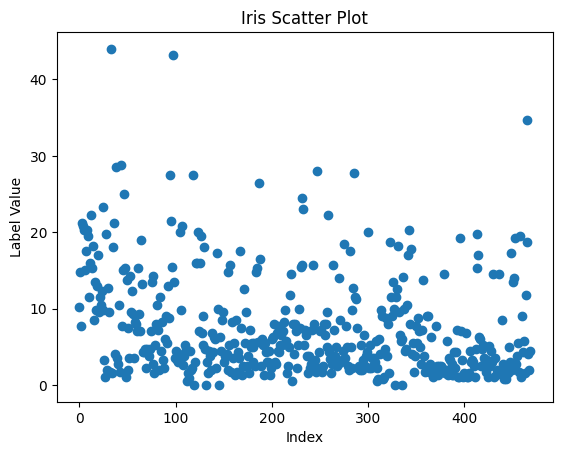

In [207]:
plt.scatter(range(len(label)), label)

# Add titles and labels (Optional but recommended)
plt.xlabel("Index")
plt.ylabel("Label Value")
plt.title("Iris Scatter Plot")

# Display the plot
plt.show()

In [208]:
import torch
import torch.nn as nn
from transformers import AutoModel

CHECKPOINT = "facebook/dinov3-vitb16-pretrain-lvd1689m"

class DinoV3Regressor(nn.Module):
    def __init__(self, freeze_backbone=True):
        super().__init__()

        self.backbone = AutoModel.from_pretrained(CHECKPOINT)
        self.freeze_backbone = freeze_backbone
        hidden_size = self.backbone.config.hidden_size

        self.regression_head = nn.Sequential(
            nn.LayerNorm(2 * hidden_size),
            nn.Linear(2 * hidden_size, 256),
            nn.GELU(),
            nn.Dropout(0.1),
            nn.Linear(256, 1),
        )

        for parameter in self.backbone.parameters():
            parameter.requires_grad = not freeze_backbone

    def extract_features(self, pixel_values):
        output = self.backbone(pixel_values=pixel_values)
        tokens = output.last_hidden_state

        cls_token = tokens[:, 0]

        num_registers = getattr(
            self.backbone.config,
            "num_register_tokens",
            0,
        )
        patch_tokens = tokens[:, 1 + num_registers:]
        pooled_patches = patch_tokens.mean(dim=1)

        return torch.cat([cls_token, pooled_patches], dim=-1)

    def forward(self, pixel_values):
        if self.freeze_backbone:
            self.backbone.eval()
            with torch.no_grad():
                features = self.extract_features(pixel_values)
        else:
            features = self.extract_features(pixel_values)

        # Shape: [batch_size]
        return self.regression_head(features).squeeze(-1)

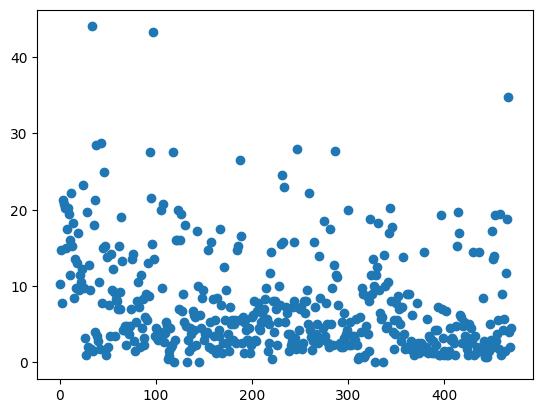

In [209]:
plt.scatter(list(range(len(label))),label)

In [224]:
# _name[0]
def get_image_path(image):
    return os.path.join(PATH, image +'.jpg')


In [225]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    images_name, label, test_size=0.33, random_state=42)

y_train = np.asarray(y_train, dtype=np.float32)
y_test  = np.asarray(y_test, dtype=np.float32)

In [226]:
target_mean = y_train.mean()
target_std  = y_train.std()

# 3. Apply training statistics to everything
y_train_norm = (y_train - target_mean) / target_std
y_test_norm  = (y_test  - target_mean) / target_std

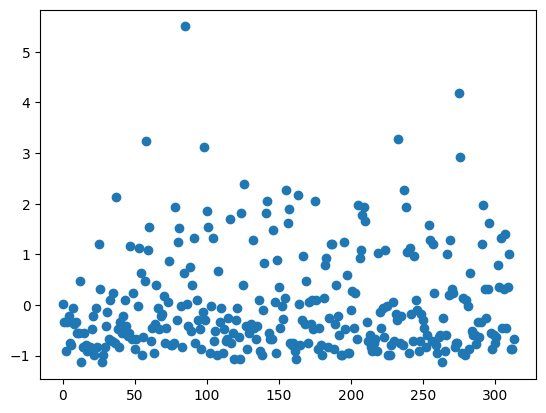

In [227]:
plt.scatter(list(range(len(y_train_norm))), y_train_norm)

In [228]:
X_train = [get_image_path(i) for i in X_train]
X_test = [get_image_path(i) for i in X_test]

In [229]:
class PlantDataset(torch.utils.data.Dataset):
    def __init__(self, image_paths, targets, processor):
        self.image_paths = image_paths
        self.targets = targets
        self.processor = processor

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        from PIL import Image

        image = Image.open(self.image_paths[idx]).convert("RGB")

        inputs = self.processor(
            images=image,
            return_tensors="pt"
        )

        pixel_values = inputs["pixel_values"].squeeze(0)

        target = torch.tensor(
            self.targets[idx],
            dtype=torch.float32
        )

        return {
            "pixel_values": pixel_values,
            "target": target
        }

In [230]:
from torch.utils.data import DataLoader

train_dataset = PlantDataset(
    X_train,
    y_train_norm,
    dino_processor
)

test_dataset = PlantDataset(
    X_test,
    y_test_norm,
    dino_processor
)

train_loader = DataLoader(
    train_dataset,
    batch_size=16,
    shuffle=True,
    num_workers=4
)

test_loader = DataLoader(
    test_dataset,
    batch_size=16,
    shuffle=True,
    num_workers=4
)


In [231]:
EPOCHS = 10

In [232]:
dino_regressor = DinoV3Regressor(freeze_backbone=True).to(device)
criterion = torch.nn.MSELoss()

Loading weights: 100%|██████████| 211/211 [00:00<00:00, 9460.87it/s]


In [233]:
optimizer = torch.optim.AdamW(
    dino_regressor.regression_head.parameters(),
    lr=1e-3,
    weight_decay=1e-4,
)

In [234]:
from sklearn.metrics import mean_absolute_error, r2_score


def evaluate_regression(
    model,
    loader,
    criterion,
    device,
    target_mean=None,
    target_std=None,
):
    model.eval()

    total_loss = 0.0
    total_samples = 0

    all_predictions = []
    all_targets = []

    with torch.no_grad():
        for batch in loader:
            pixel_values = batch["pixel_values"].to(device)
            targets_norm = batch["target"].float().to(device)

            predictions_norm = model(pixel_values)

            loss = criterion(
                predictions_norm,
                targets_norm
            )

            batch_size = pixel_values.size(0)

            total_loss += loss.item() * batch_size
            total_samples += batch_size

            all_predictions.append(
                predictions_norm.cpu()
            )
            all_targets.append(
                targets_norm.cpu()
            )

    predictions = torch.cat(all_predictions).numpy()
    targets = torch.cat(all_targets).numpy()

    average_loss = total_loss / total_samples

    # If you provide training target mean/std,
    # calculate metrics in ORIGINAL units.
    if target_mean is not None and target_std is not None:

        predictions_real = (
            predictions * target_std
            + target_mean
        )

        targets_real = (
            targets * target_std
            + target_mean
        )

    else:
        predictions_real = predictions
        targets_real = targets

    mae = mean_absolute_error(
        targets_real,
        predictions_real
    )

    r2 = r2_score(
        targets_real,
        predictions_real
    )

    return average_loss, mae, r2

In [235]:
def save_checkpoint(
    model,
    optimizer,
    epoch,
    val_loss,
    val_mae,
    val_r2,
    target_mean,
    target_std,
    save_path="best_dinov3_regressor.pt",
):

    torch.save(
        {
            "epoch": epoch,

            "model_state_dict":
                model.state_dict(),

            "optimizer_state_dict":
                optimizer.state_dict(),

            "val_loss": val_loss,
            "val_mae": val_mae,
            "val_r2": val_r2,

            "target_mean": target_mean,
            "target_std": target_std,
        },
        save_path,
    )

In [236]:
def train_regressor(
    model,
    train_loader,
    val_loader,
    optimizer,
    criterion,
    device,
    epochs=20,
    eval_every=2,
    target_mean=None,
    target_std=None,
):

    history = {
        "train_loss": [],
        "val_epochs": [],
        "val_loss": [],
        "val_mae": [],
        "val_r2": [],
    }
    
    best_val_loss = float("inf")

    for epoch in range(1, epochs + 1):

        model.train()

        running_loss = 0.0
        total_samples = 0

        for batch in train_loader:

            pixel_values = batch["pixel_values"].to(device)
            targets_norm = batch["target"].float().to(device)

            optimizer.zero_grad()

            predictions_norm = model(pixel_values)

            loss = criterion(
                predictions_norm,
                targets_norm
            )

            loss.backward()
            optimizer.step()

            batch_size = pixel_values.size(0)

            running_loss += loss.item() * batch_size
            total_samples += batch_size

        train_loss = running_loss / total_samples

        history["train_loss"].append(train_loss)

        print(
            f"Epoch {epoch:03d}/{epochs} | "
            f"Train Loss: {train_loss:.5f}",
            end=""
        )

        # ----------------------------
        # Validation
        # ----------------------------

        if epoch % eval_every == 0:

            val_loss, val_mae, val_r2 = evaluate_regression(
                model=model,
                loader=val_loader,
                criterion=criterion,
                device=device,
                target_mean=target_mean,
                target_std=target_std,
            )

            history["val_epochs"].append(epoch)
            history["val_loss"].append(val_loss)
            history["val_mae"].append(val_mae)
            history["val_r2"].append(val_r2)

            print(
                f" | Val Loss: {val_loss:.5f}"
                f" | MAE: {val_mae:.3f}"
                f" | R²: {val_r2:.3f}"
            )

            if val_loss < best_val_loss:

                best_val_loss = val_loss

                save_checkpoint(
                    model=dino_regressor,
                    optimizer=optimizer,
                    epoch=epoch,
                    val_loss=val_loss,
                    val_mae=val_mae,
                    val_r2=val_r2,
                    target_mean=target_mean,
                    target_std=target_std,
                )

                print(
                    "New best model saved!"
                )

        else:
            print()

    return history

In [237]:
history = train_regressor(
    model=dino_regressor,
    train_loader=train_loader,
    val_loader=test_loader,
    optimizer=optimizer,
    criterion=criterion,
    device=device,
    epochs=30,
    eval_every=6,
    target_mean=target_mean,
    target_std=target_std,
)

Epoch 001/30 | Train Loss: 2.13975
Epoch 002/30 | Train Loss: 1.04145
Epoch 003/30 | Train Loss: 1.10434
Epoch 004/30 | Train Loss: 0.99204
Epoch 005/30 | Train Loss: 0.97524
Epoch 006/30 | Train Loss: 0.96057 | Val Loss: 1.14776 | MAE: 4.971 | R²: 0.004
New best model saved!
Epoch 007/30 | Train Loss: 1.01717
Epoch 008/30 | Train Loss: 0.96918
Epoch 009/30 | Train Loss: 0.95240
Epoch 010/30 | Train Loss: 0.96552
Epoch 011/30 | Train Loss: 0.93441
Epoch 012/30 | Train Loss: 0.94839 | Val Loss: 1.11074 | MAE: 5.156 | R²: 0.036
New best model saved!
Epoch 013/30 | Train Loss: 0.95003
Epoch 014/30 | Train Loss: 0.90134
Epoch 015/30 | Train Loss: 0.88689
Epoch 016/30 | Train Loss: 0.92688
Epoch 017/30 | Train Loss: 0.87899
Epoch 018/30 | Train Loss: 0.96210 | Val Loss: 1.09634 | MAE: 5.202 | R²: 0.048
New best model saved!
Epoch 019/30 | Train Loss: 0.91117
Epoch 020/30 | Train Loss: 0.87091
Epoch 021/30 | Train Loss: 0.84740
Epoch 022/30 | Train Loss: 0.86993
Epoch 023/30 | Train Loss: 0.

In [238]:
def plot_training_history(history):

    # ----------------------------
    # Loss
    # ----------------------------

    plt.figure(figsize=(8, 5))

    train_epochs = range(
        1,
        len(history["train_loss"]) + 1
    )

    plt.plot(
        train_epochs,
        history["train_loss"],
        label="Train Loss"
    )

    plt.plot(
        history["val_epochs"],
        history["val_loss"],
        marker="o",
        label="Validation Loss"
    )

    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Training and Validation Loss")
    plt.legend()
    plt.grid(True)
    plt.show()


    # ----------------------------
    # MAE
    # ----------------------------

    plt.figure(figsize=(8, 5))

    plt.plot(
        history["val_epochs"],
        history["val_mae"],
        marker="o"
    )

    plt.xlabel("Epoch")
    plt.ylabel("MAE")
    plt.title("Validation MAE")
    plt.grid(True)
    plt.show()


    # ----------------------------
    # R²
    # ----------------------------

    plt.figure(figsize=(8, 5))

    plt.plot(
        history["val_epochs"],
        history["val_r2"],
        marker="o"
    )

    plt.xlabel("Epoch")
    plt.ylabel("R²")
    plt.title("Validation R²")
    plt.grid(True)
    plt.show()

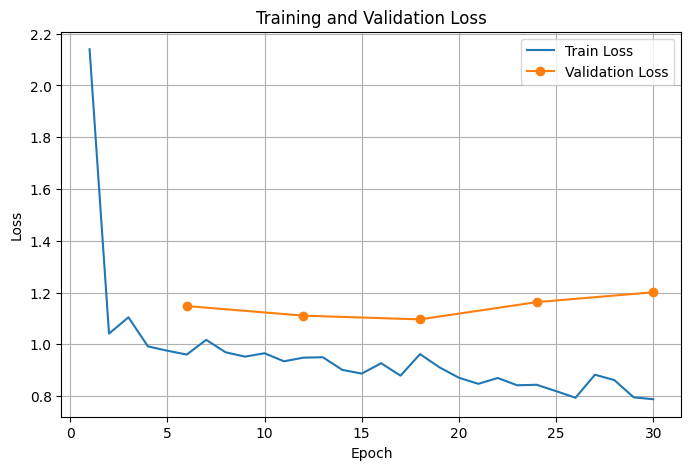

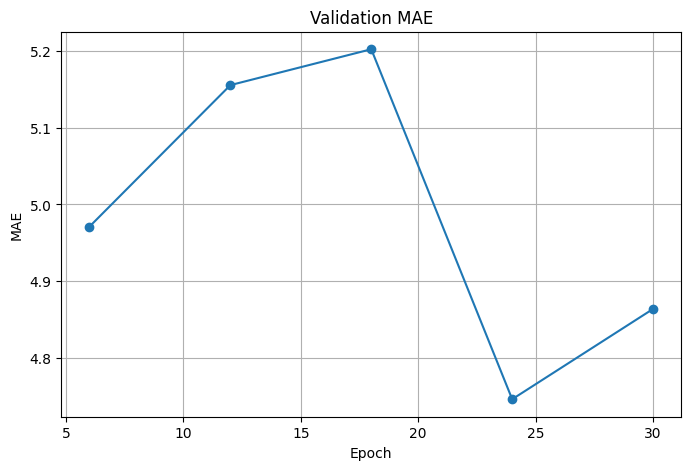

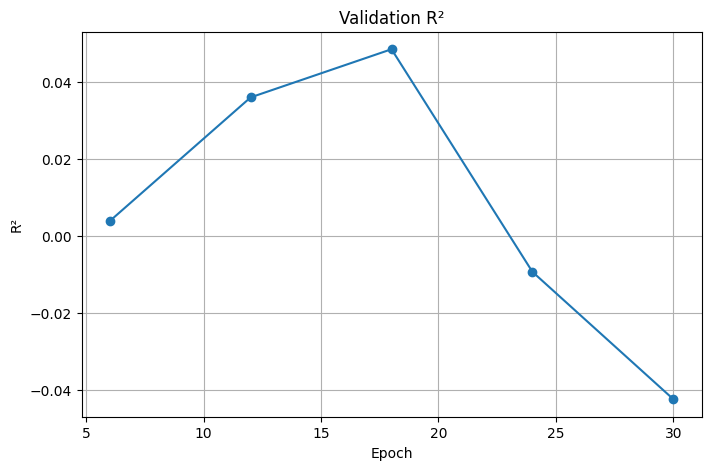

In [239]:
plot_training_history(history)

In [245]:
import numpy as np
from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    r2_score,
)

# Convert normalized test targets back to original units.
test_targets_real = (
    np.asarray(y_test_norm, dtype=float) * target_std
    + target_mean
)

# Baseline always predicts the training-target mean.
baseline_predictions = np.full(
    test_targets_real.shape,
    fill_value=target_mean,
    dtype=float,
)

print(
    "Baseline MAE:",
    mean_absolute_error(
        test_targets_real,
        baseline_predictions,
    ),
)

print(
    "Baseline RMSE:",
    mean_squared_error(
        test_targets_real,
        baseline_predictions,
    ) ** 0.5,
)

print(
    "Baseline R²:",
    r2_score(
        test_targets_real,
        baseline_predictions,
    ),
)

Baseline MAE: 5.237418243347473
Baseline RMSE: 6.994796225861234
Baseline R²: -5.1815111487663046e-05


In [ ]:
def predict_regression(
    model,
    loader,
    device,
    target_mean=None,
    target_std=None,
):
    """
    Generate predictions and return targets/predictions
    in their original units.
    """
    if (target_mean is None) != (target_std is None):
        raise ValueError(
            "Provide both target_mean and target_std, or neither."
        )

    model.eval()

    all_predictions = []
    all_targets = []

    with torch.inference_mode():
        for batch in loader:
            pixel_values = batch["pixel_values"].to(device)

            predictions_norm = model(pixel_values)
            targets_norm = batch["target"].float()

            # Ensure both have shape [batch_size].
            predictions_norm = predictions_norm.reshape(-1)
            targets_norm = targets_norm.reshape(-1)

            all_predictions.append(
                predictions_norm.cpu()
            )
            all_targets.append(
                targets_norm.cpu()
            )

    predictions_norm = torch.cat(all_predictions).numpy()
    targets_norm = torch.cat(all_targets).numpy()

    if target_mean is not None:
        target_mean = float(target_mean)
        target_std = float(target_std)

        predictions_real = (
            predictions_norm * target_std
            + target_mean
        )

        targets_real = (
            targets_norm * target_std
            + target_mean
        )
    else:
        predictions_real = predictions_norm
        targets_real = targets_norm

    return targets_real, predictions_real

In [248]:
def plot_regression_predictions(
    targets,
    predictions,
    title="Regression results",
):
    targets = np.asarray(targets).reshape(-1)
    predictions = np.asarray(predictions).reshape(-1)

    mae = mean_absolute_error(targets, predictions)
    rmse = mean_squared_error(targets, predictions) ** 0.5
    r2 = r2_score(targets, predictions)

    residuals = predictions - targets

    lower = min(targets.min(), predictions.min())
    upper = max(targets.max(), predictions.max())

    figure, axes = plt.subplots(
        1,
        2,
        figsize=(13, 5),
    )

    # Actual versus predicted
    axes[0].scatter(
        targets,
        predictions,
        alpha=0.65,
        edgecolors="none",
    )

    # Perfect-prediction line
    axes[0].plot(
        [lower, upper],
        [lower, upper],
        linestyle="--",
        color="red",
        label="Perfect prediction",
    )

    axes[0].set_xlabel("Actual value")
    axes[0].set_ylabel("Predicted value")
    axes[0].set_title(title)
    axes[0].legend()
    axes[0].grid(alpha=0.25)

    metric_text = (
        f"MAE = {mae:.3f}\n"
        f"RMSE = {rmse:.3f}\n"
        f"R² = {r2:.3f}"
    )

    axes[0].text(
        0.05,
        0.95,
        metric_text,
        transform=axes[0].transAxes,
        verticalalignment="top",
        bbox={
            "boxstyle": "round",
            "facecolor": "white",
            "alpha": 0.85,
        },
    )

    # Residual plot
    axes[1].scatter(
        predictions,
        residuals,
        alpha=0.65,
        edgecolors="none",
    )

    axes[1].axhline(
        0,
        linestyle="--",
        color="red",
    )

    axes[1].set_xlabel("Predicted value")
    axes[1].set_ylabel("Residual: prediction − actual")
    axes[1].set_title("Residuals")
    axes[1].grid(alpha=0.25)

    plt.tight_layout()
    plt.show()

    return {
        "mae": mae,
        "rmse": rmse,
        "r2": r2,
    }

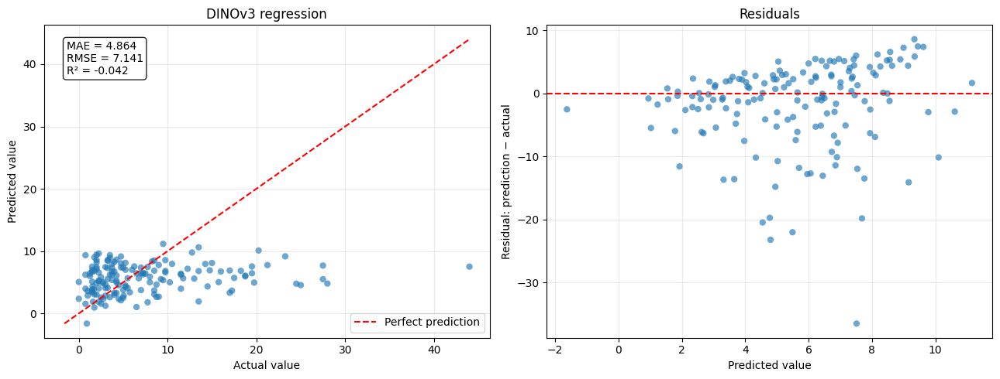

{'mae': 4.863694190979004, 'rmse': 7.141470093249249, 'r2': -0.04243171215057373}


In [249]:
targets_real, predictions_real = predict_regression(
    model=dino_regressor,
    loader=test_loader,
    device=device,
    target_mean=target_mean,
    target_std=target_std,
)

metrics = plot_regression_predictions(
    targets=targets_real,
    predictions=predictions_real,
    title="DINOv3 regression",
)

print(metrics)

In [251]:
for target, prediction in zip(
    targets_real,
    predictions_real,
):
    print(
        f"Target: {target:7.2f} | "
        f"Prediction: {prediction:7.2f}"
    )

Target:   18.75 | Prediction:    6.06
Target:   13.50 | Prediction:    6.80
Target:    4.00 | Prediction:    2.99
Target:    8.25 | Prediction:    8.35
Target:    2.75 | Prediction:    2.33
Target:   12.75 | Prediction:    9.78
Target:    8.00 | Prediction:    5.00
Target:    8.75 | Prediction:    2.62
Target:    9.75 | Prediction:    8.55
Target:    7.00 | Prediction:    6.42
Target:    3.75 | Prediction:    6.23
Target:   27.50 | Prediction:    7.68
Target:    2.25 | Prediction:    5.28
Target:    3.25 | Prediction:    4.12
Target:    4.25 | Prediction:    5.22
Target:    1.60 | Prediction:    1.87
Target:    1.50 | Prediction:    6.95
Target:   23.25 | Prediction:    9.16
Target:    8.00 | Prediction:    5.89
Target:    3.75 | Prediction:    7.93
Target:    1.50 | Prediction:    3.80
Target:    6.25 | Prediction:    7.54
Target:    7.75 | Prediction:    1.78
Target:    4.25 | Prediction:    8.63
Target:    3.25 | Prediction:    7.30
Target:   11.50 | Prediction:    6.22
Target:   24

In [252]:
def show_regression_predictions(
    model,
    loader,
    processor,
    device,
    target_mean,
    target_std,
    num_images=12,
    columns=4,
):
    model.eval()

    displayed_images = []
    displayed_targets = []
    displayed_predictions = []

    with torch.inference_mode():
        for batch in loader:
            pixel_values = batch["pixel_values"].to(device)
            targets_norm = batch["target"].float().to(device).reshape(-1)

            predictions_norm = model(pixel_values).reshape(-1)

            # Convert predictions and targets back to original units.
            predictions_real = (
                predictions_norm * target_std
                + target_mean
            )

            targets_real = (
                targets_norm * target_std
                + target_mean
            )

            displayed_images.append(pixel_values.cpu())
            displayed_targets.append(targets_real.cpu())
            displayed_predictions.append(predictions_real.cpu())

            collected = sum(
                images.size(0)
                for images in displayed_images
            )

            if collected >= num_images:
                break

    images = torch.cat(displayed_images)[:num_images]
    targets = torch.cat(displayed_targets)[:num_images].numpy()
    predictions = (
        torch.cat(displayed_predictions)[:num_images].numpy()
    )

    # Undo the image normalization used by the processor.
    image_mean = torch.tensor(
        processor.image_mean,
        dtype=images.dtype,
    ).view(1, -1, 1, 1)

    image_std = torch.tensor(
        processor.image_std,
        dtype=images.dtype,
    ).view(1, -1, 1, 1)

    images = images * image_std + image_mean
    images = images.clamp(0, 1)

    rows = math.ceil(num_images / columns)

    figure, axes = plt.subplots(
        rows,
        columns,
        figsize=(4 * columns, 4 * rows),
    )

    axes = np.atleast_1d(axes).reshape(-1)

    for index in range(num_images):
        image = images[index].permute(1, 2, 0).numpy()

        target = targets[index]
        prediction = predictions[index]
        error = prediction - target

        axes[index].imshow(image)
        axes[index].axis("off")

        axes[index].set_title(
            f"Target: {target:.2f}\n"
            f"Predicted: {prediction:.2f}\n"
            f"Error: {error:+.2f}",
            color="green" if abs(error) < 2 else "darkred",
        )

    # Hide unused panels.
    for index in range(num_images, len(axes)):
        axes[index].axis("off")

    figure.suptitle(
        "DINOv3 regression predictions",
        fontsize=16,
    )

    plt.tight_layout()
    plt.show()

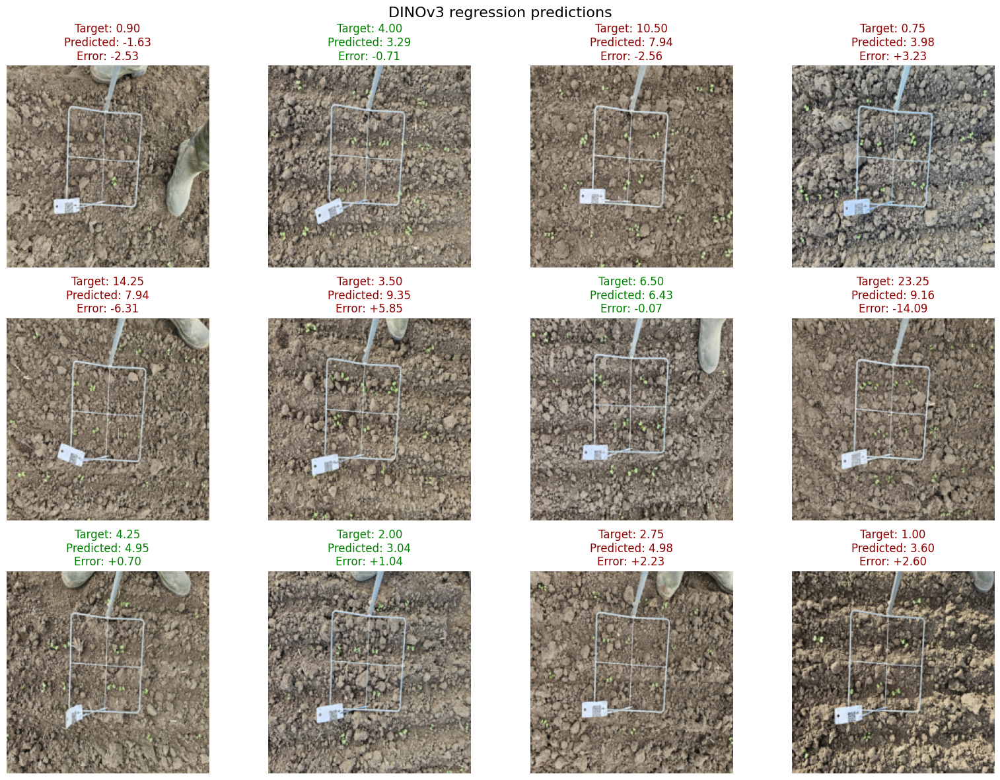

In [253]:
show_regression_predictions(
    model=dino_regressor,
    loader=test_loader,
    processor=dino_processor,
    device=device,
    target_mean=target_mean,
    target_std=target_std,
    num_images=12,
    columns=4,
)